In [1]:
import matplotlib.pyplot as plt
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

import matplotlib as mpl
# enables correct plotting of text
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42 

import celltypist

In [2]:
# import session_info
# session_info.show()

In [3]:
import importlib.util
import sys
spec = importlib.util.spec_from_file_location("module.name", "/nfs/team205/kk18/function/python/utils.py")
utils = importlib.util.module_from_spec(spec)
sys.modules["module.name"] = utils
spec.loader.exec_module(utils)

In [4]:
sc.settings.set_figure_params(dpi=80)

# Variables

In [5]:
adata_dir = '/lustre/scratch126/cellgen/team205/kk18/VisiumHD/objects/subsets'
sample_id = 'HEA_FOET14880396'
celltype = 'EndocardialCells'

In [6]:
figdir = '/nfs/team205/heart/fetal_ms_figures/raw_plots_kk/Aug2024'
table_dir = '/nfs/team205/heart/fetal_ms_figures/tables/Aug2024'

# Read in data

In [7]:
# read in
adata = sc.read_h5ad(f'{adata_dir}/{sample_id}_{celltype}_b2c_cells_filtered_lognorm.h5ad')
adata

AnnData object with n_obs × n_vars = 1526 × 14451
    obs: 'object_id', 'bin_count', 'array_row', 'array_col', 'labels_joint_source', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'celltypist_coarse', 'conf_score_coarse', 'celltypist_coarse_fin', 'celltypist_coarse2midmod', 'conf_score_coarse2midmod', 'celltypist_mid_fin', 'celltypist_midmod2fine', 'conf_score_midmod2fine', 'leiden_0.2', 'leiden_0.4', 'leiden_0.6', 'leiden_1', 'leiden_1.2', 'leiden_1.5', 'leiden_2'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'celltypist_coarse2midmod_colors', 'celltypist_coa

# Remove mid-grain markers from the feature

In [8]:
# read in
midgrain_markers = pd.read_csv('/nfs/team205/kk18/notebooks/Foetal/VisiumHD/re-seq_mpp0p3/sc_midgrain_markers.csv',
                               index_col=0
                              )
# remove the markers of celltype of interest
midgrain_markers = midgrain_markers[midgrain_markers['group']!=celltype]
midgrain_markers

,group,names,scores,logfoldchanges,pvals,pvals_adj,group_mean
0,AtrialCardiomyocytes,MYH6,589.180000,8.461190,0.0,0.0,3.555969
1,AtrialCardiomyocytes,PAM,446.767100,5.372062,0.0,0.0,4.026159
2,AtrialCardiomyocytes,NPPA,444.359400,7.048445,0.0,0.0,4.366144
3,AtrialCardiomyocytes,MYL7,444.032530,5.999820,0.0,0.0,4.489749
4,AtrialCardiomyocytes,TNNT2,428.842380,4.739163,0.0,0.0,3.264460
...,...,...,...,...,...,...,...
102668,LymphoidCells,ADK,54.743217,1.088896,0.0,0.0,1.117559
102770,LymphoidCells,FCHSD2,51.053140,1.119463,0.0,0.0,1.309117
102785,LymphoidCells,SPIDR,50.689087,1.023158,0.0,0.0,1.011237
102788,LymphoidCells,IMMP2L,50.527325,1.016055,0.0,0.0,1.424370


In [9]:
# remove
mask = [x not in list(midgrain_markers['names']) for x in adata.var_names]
bdata = adata[:,mask]
bdata

View of AnnData object with n_obs × n_vars = 1526 × 13211
    obs: 'object_id', 'bin_count', 'array_row', 'array_col', 'labels_joint_source', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'celltypist_coarse', 'conf_score_coarse', 'celltypist_coarse_fin', 'celltypist_coarse2midmod', 'conf_score_coarse2midmod', 'celltypist_mid_fin', 'celltypist_midmod2fine', 'conf_score_midmod2fine', 'leiden_0.2', 'leiden_0.4', 'leiden_0.6', 'leiden_1', 'leiden_1.2', 'leiden_1.5', 'leiden_2'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'celltypist_coarse2midmod_colors', 'cellty

# PCA, Clustering, UMAP

number of hvgs: 3336


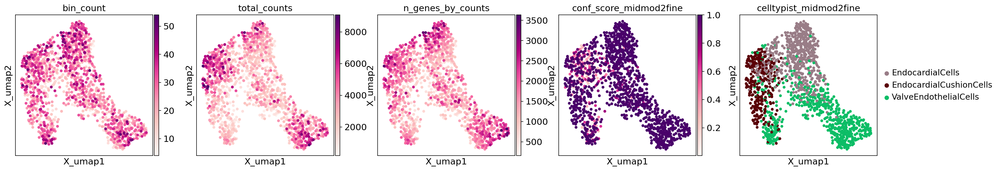

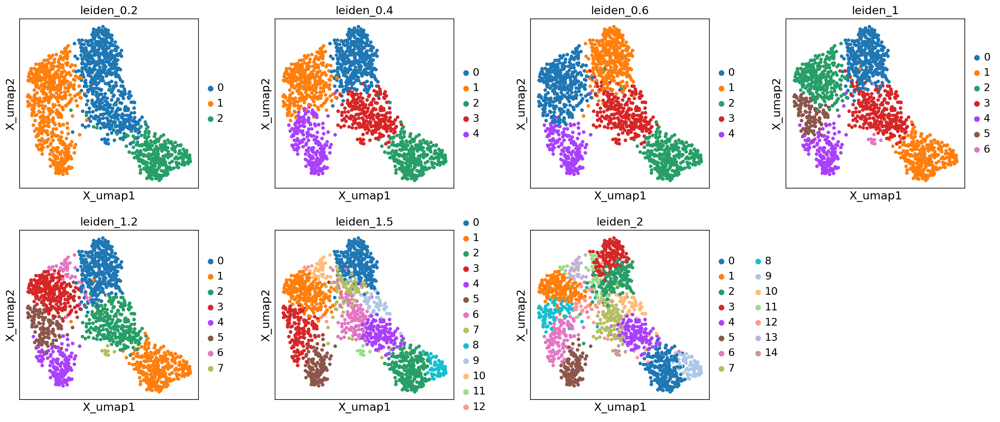

In [10]:
# HVGs, using the object which doesn't have midgrain markers
sc.pp.highly_variable_genes(bdata, flavor='seurat', min_mean=0.0125, max_mean=3, min_disp=0.5)
print(f'number of hvgs: {sum(bdata.var.highly_variable)}')
# PCA using the degected HVGs
sc.tl.pca(bdata, use_highly_variable=True)
adata.obsm['X_pca'] = bdata.obsm['X_pca'].copy()
# create neighbour graph
sc.pp.neighbors(adata,n_neighbors=15,use_rep='X_pca')
# visualisation with umap
sc.tl.umap(adata,min_dist=0.5)
sc.pl.embedding(adata,basis='X_umap',color=['bin_count','total_counts','n_genes_by_counts',"conf_score_midmod2fine","celltypist_midmod2fine",],
                wspace=0.2,cmap='RdPu',vmax='p100',ncols=5)
# leiden clustering
resolutions_list = [0.2,0.4,0.6,1,1.2,1.5,2]
for resolution in resolutions_list:
    sc.tl.leiden(adata,resolution=resolution,key_added=f'leiden_{str(resolution)}',n_iterations=2)
sc.pl.embedding(adata,basis='X_umap',
                color=[f'leiden_{str(resolution)}' for resolution in resolutions_list],
                wspace=0.3)

# Markers 

In [12]:
# read in markers identified using single-nucleus data
markers_df = pd.read_csv(f'/nfs/team205/kk18/notebooks/Foetal/VisiumHD/re-seq_mpp0p3/sc_{celltype}_finegrain_markers.csv')

mask1 = markers_df['group_mean']>1
mask2 = markers_df['logfoldchanges']>1
markers_df = markers_df[mask1&mask2]

markers_df

,Unnamed: 0,group,names,scores,logfoldchanges,pvals,pvals_adj,group_mean
0,0,EndocardialCells,NPR3,83.162766,4.978716,0.000000e+00,0.000000e+00,1.286209
1,1,EndocardialCells,ADGRG6,66.080210,3.620378,0.000000e+00,0.000000e+00,1.332066
2,2,EndocardialCells,TMEM100,52.056534,2.688110,0.000000e+00,0.000000e+00,1.196709
3,3,EndocardialCells,ITGA8,51.051582,2.888310,0.000000e+00,0.000000e+00,1.310360
4,4,EndocardialCells,SPARCL1,50.065113,3.642935,0.000000e+00,0.000000e+00,1.002682
...,...,...,...,...,...,...,...,...
4304,6926,ValveEndothelialCells,EDN1,16.825920,1.719823,2.825901e-58,1.307918e-56,1.062214
4312,6934,ValveEndothelialCells,PDLIM3,16.685167,1.103224,6.742946e-58,3.083945e-56,1.000706
4422,7044,ValveEndothelialCells,NEAT1,15.361677,1.183018,1.143893e-49,4.190861e-48,1.424046
4630,7252,ValveEndothelialCells,GNG11,13.088981,1.005467,3.537692e-37,9.120693e-36,1.181871


In [13]:
markers = {}
n_top = 10
for c in set(markers_df['group']):
    markers_df_sub = markers_df[markers_df['group']==c]
    markers_df_sub.sort_values('logfoldchanges',ascending=False)
    markers[c]=list(markers_df_sub[:n_top]['names'])

# manually add genes
markers['Cycling'] = ['MKI67','TOP2A'] 

genes = []
for g in markers.values():
    genes = genes + [x for x in g if (x in list(adata.var_names))&(x not in genes)]
for key in markers.keys():
    markers[key]=[x for x in markers[key] if x in list(adata.var_names)]
len(genes)

32

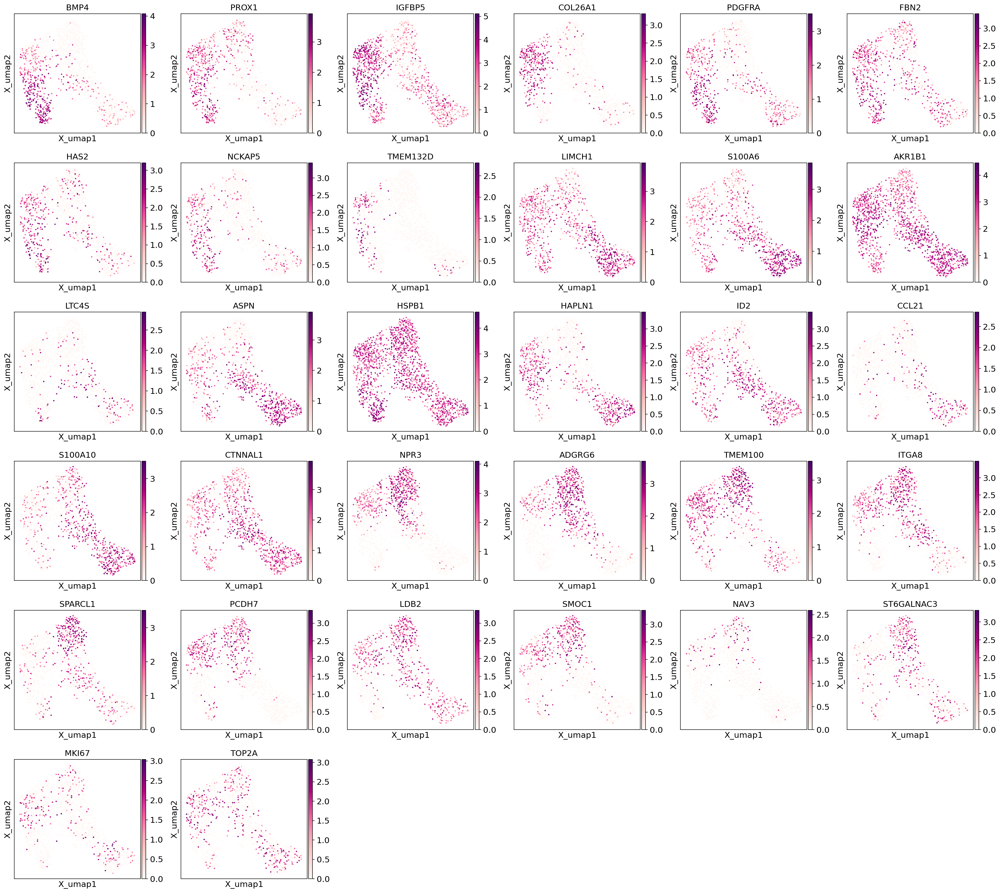

In [15]:
sc.pl.embedding(adata,basis='X_umap',color=genes, size=20,
               ncols=6, wspace=0.2,cmap='RdPu',vmax='p99.7')

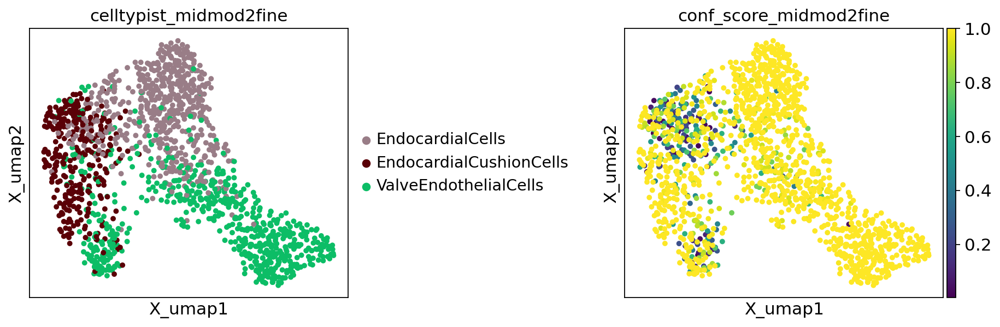

In [24]:
sc.pl.embedding(adata,basis='X_umap',
                color=['celltypist_midmod2fine', 'conf_score_midmod2fine'],
                wspace=0.7)

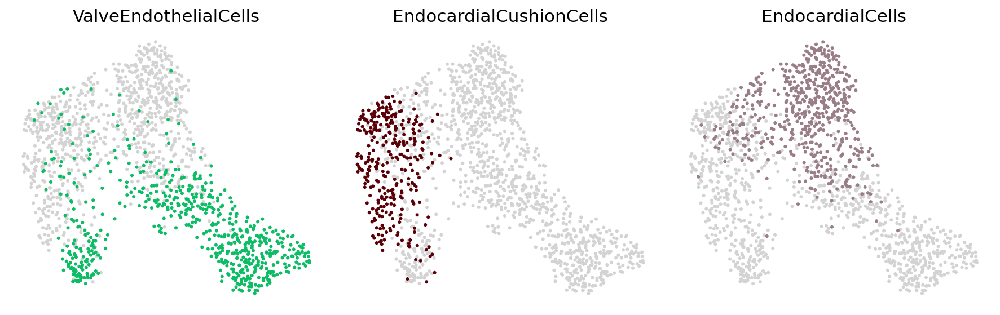

In [16]:
# umap per celltype to highlight
group_col = 'celltypist_midmod2fine'
groups_to_plot = list(set(adata.obs[group_col]))

plt.rcParams['axes.grid'] = False
fig,axs=plt.subplots(nrows=2,ncols=4,figsize=(15,7))
# Flatten the axs array for easier iteration in case of multiple rows and columns
axs_flat = axs.flatten()

for i,grp in enumerate(groups_to_plot):
    sc.pl.umap(adata, color=[group_col], groups=grp, 
               size=30, frameon=False,
               show=False, ax=axs_flat[i], legend_loc=None, legend_fontsize=5,
               title=grp
              )
# Turn off any remaining subplots
for j in range(len(groups_to_plot), len(axs_flat)):
    fig.delaxes(axs_flat[j])

# fig.suptitle('Main Title for the Figure')
fig.tight_layout()

In [41]:
resolution_sel = 1

categories: 0, 1, 2, etc.
var_group_labels: CM, FB, EC, etc.


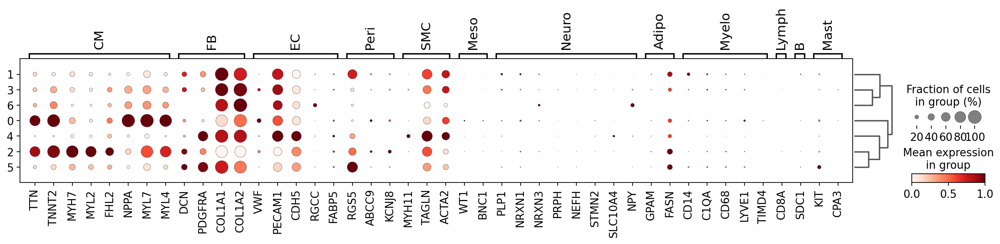

In [42]:
markers_others = {
    'CM': ['TTN', 'TNNT2','MYH6',
        'MYH7', 'MYL2', 'FHL2', # vCN
            'NPPA', 'MYL7', 'MYL4'], #aCM
    'FB': ['DCN', 'GCN', 'PDGFRA','COL1A1','COL1A2'],
    'EC': ['VWF', 'PECAM1', 'CDH5','RGCC', 'FABP5',],
    'Peri': ['RGS5', 'ABCC9', 'KCNJ8'],
    'SMC': ['MYH11', 'TAGLN', 'ACTA2'],
    'Meso': ['MSLN', 'WT1', 'BNC1'],
    'Neuro': ['PLP1', 'NRXN1', 'NRXN3','PRPH', 'NEFL', 'NEFM', 'NEFH', 'STMN2', 'SST', 'SLC10A4', 'SLC18A3', 'TH', 'NPY'],
    'Adipo': ['GPAM', 'FASN', 'LEP'],
    'Myelo': ['CD14', 'C1QA', 'CD68','LYVE1','TIMD4'],
    'Lymph': ['CD8A', 'IL7R', 'CD40LG'],
    'B': ['CD19','SDC1','IGHG1','IGHA1'],
    'Mast': ['KIT', 'CPA3'],
}

for key in markers_others.keys():
    markers_others[key]=[x for x in markers_others[key] if x in adata.var_names]

sc.tl.dendrogram(adata, groupby=f'leiden_{str(resolution_sel)}')
sc.pl.dotplot(adata,
              markers_others, 
              groupby=f'leiden_{str(resolution_sel)}',
              dendrogram=True,
              standard_scale="var",
              color_map="Reds",
              swap_axes=False,
             )

categories: 0, 1, 2, etc.
var_group_labels: EndocardialCushionCells, ValveEndothelialCells, EndocardialCells, etc.


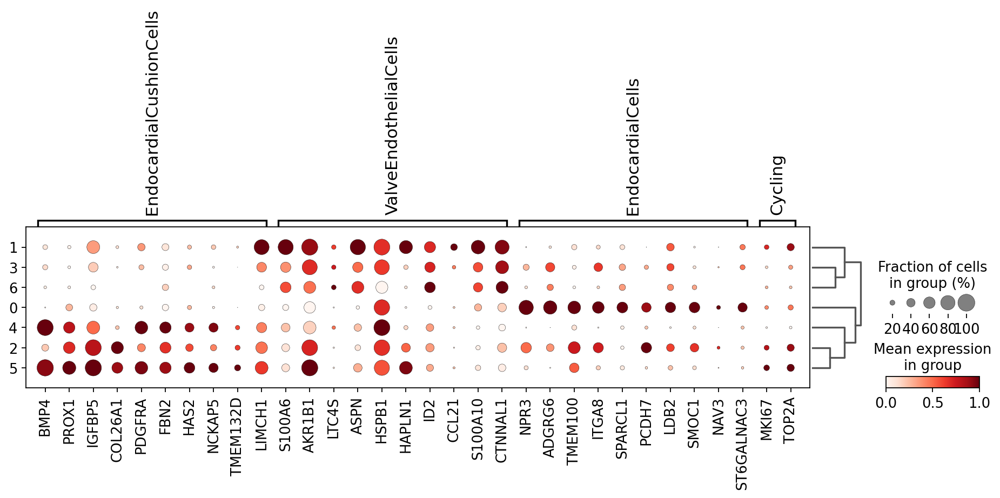

In [43]:
sc.tl.dendrogram(adata,groupby=f'leiden_{str(resolution_sel)}')
sc.pl.dotplot(adata,
              var_names=markers,
              groupby=f'leiden_{str(resolution_sel)}',
              standard_scale='var',
              dendrogram=True
             )

[1.84898172 2.52192218 2.53797117 1.50684599 2.05779654]


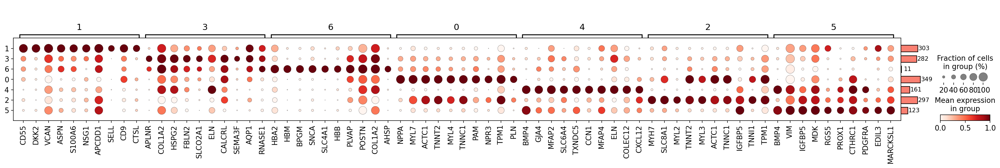

In [44]:
# DEG analysis
print(adata.X.data[:5])
adata.uns['log1p']['base']=None
sc.tl.rank_genes_groups(adata,groupby=f'leiden_{str(resolution_sel)}')
sc.tl.dendrogram(adata, groupby=f'leiden_{str(resolution_sel)}')
dp=sc.pl.rank_genes_groups_dotplot(adata, dendrogram=True, standard_scale='var', return_fig=True)
dp.add_totals().show()

[1.84898172 2.52192218 2.53797117 1.50684599 2.05779654]


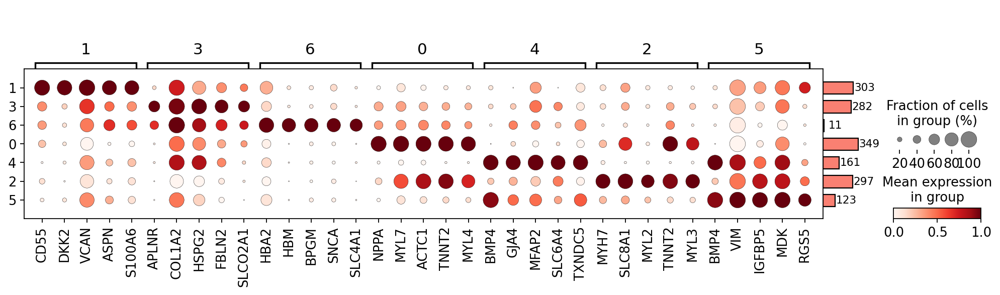

In [45]:
# DEG analysis
print(adata.X.data[:5])
adata.uns['log1p']['base']=None
sc.tl.rank_genes_groups(adata,groupby=f'leiden_{str(resolution_sel)}')
sc.tl.dendrogram(adata, groupby=f'leiden_{str(resolution_sel)}')
dp=sc.pl.rank_genes_groups_dotplot(adata, dendrogram=True, standard_scale='var', return_fig=True, n_genes=5)
dp.add_totals().show()

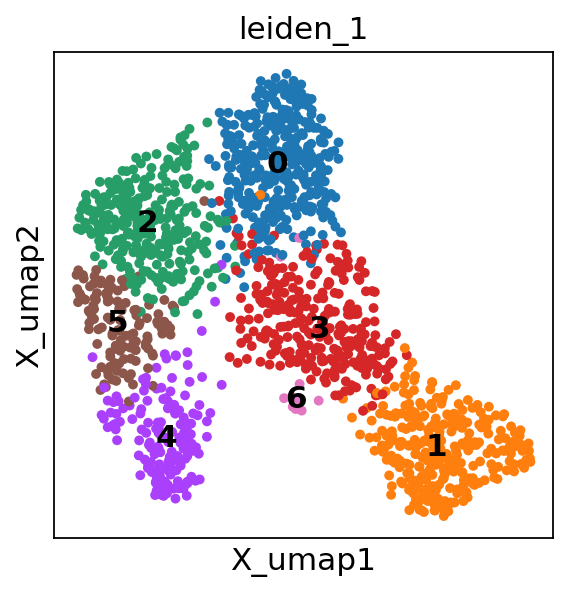

In [46]:
sc.pl.embedding(adata,basis='X_umap',
                color=f'leiden_{str(resolution_sel)}',
                wspace=0.3, legend_loc='on data')

Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings 

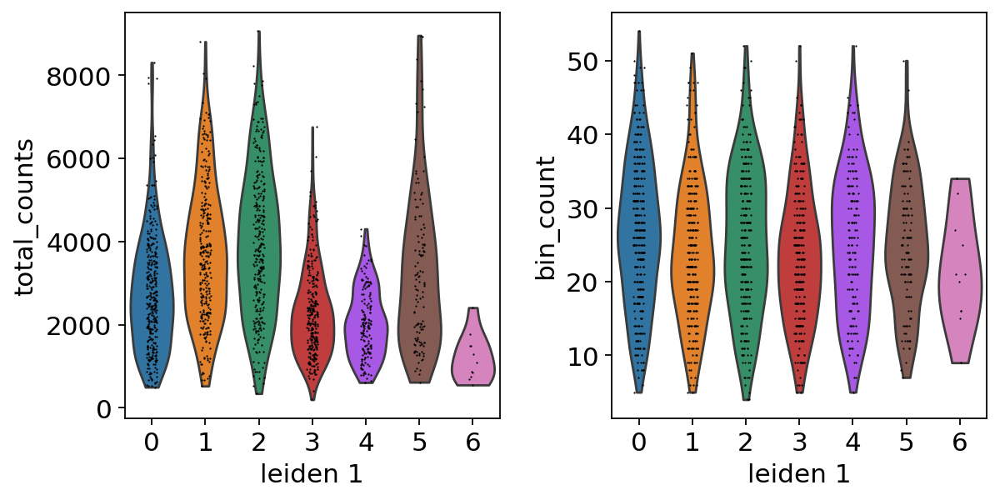

In [25]:
sc.pl.violin(adata,keys=['total_counts','bin_count'],groupby=f'leiden_{str(resolution_sel)}')

In [47]:
# annotate
adata.obs['fine_grain_manual'] = adata.obs[f'leiden_{str(resolution_sel)}'].copy()
adata.obs.replace({'fine_grain_manual':{
    '0':'EndocardialCells',
    '1':'ValveEndothelialCells',
    '2':'uncertain',
    '3':'ValveEndothelialCells',
    '4':'EndocardialCushionCells', # contamination from valveECs
    '5':'EndocardialCushionCells',
    '6':'Erythrocytes',
}},inplace=True)
adata.obs['fine_grain_manual'].value_counts()

fine_grain_manual
ValveEndothelialCells      585
EndocardialCells           349
uncertain                  297
EndocardialCushionCells    284
Erythrocytes                11
Name: count, dtype: int64

In [48]:
ad = sc.read_h5ad('/nfs/team205/heart/anndata_objects/Foetal/Feb28ObjectRaw_finegrain_updated.h5ad',backed='r')
ad = ad[ad.obs['mid_grain']==celltype]
set(ad.obs['fine_grain'])

{'EndocardialCells', 'EndocardialCushionCells', 'ValveEndothelialCells'}

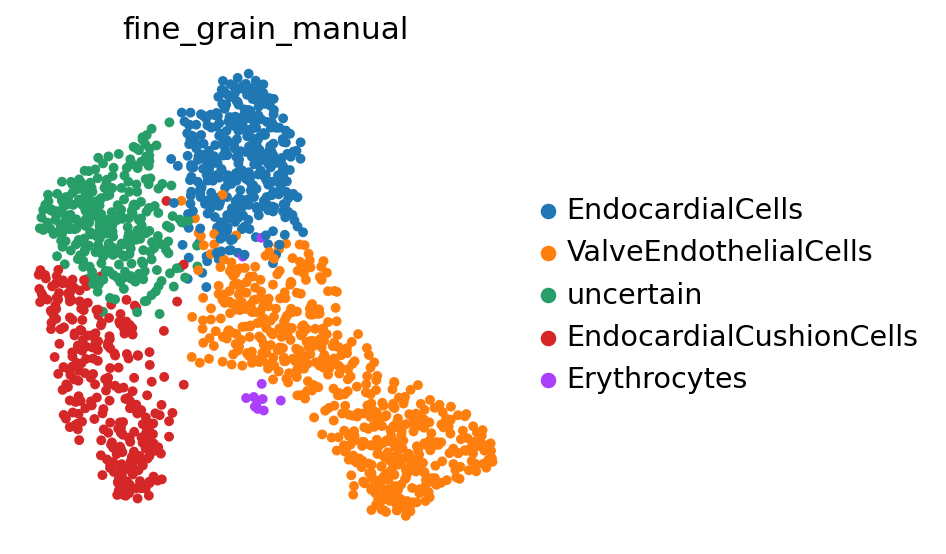

In [49]:
sc.pl.embedding(adata,basis='X_umap',
                color='fine_grain_manual',
                frameon=False,
                wspace=0.3)

# Subset "uncertain" cells

In [50]:
adata_sub = adata[adata.obs['fine_grain_manual'].isin(['uncertain'])]

# drop leiden clustering results
resolutions_list = [0.2,0.4,0.6,1, 1.2,1.5,2]
for resolution in resolutions_list:
    adata_sub.obs.drop(f'leiden_{str(resolution)}',axis=1,inplace=True)
adata_sub

AnnData object with n_obs × n_vars = 297 × 14451
    obs: 'object_id', 'bin_count', 'array_row', 'array_col', 'labels_joint_source', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'celltypist_coarse', 'conf_score_coarse', 'celltypist_coarse_fin', 'celltypist_coarse2midmod', 'conf_score_coarse2midmod', 'celltypist_mid_fin', 'celltypist_midmod2fine', 'conf_score_midmod2fine', 'fine_grain_manual'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'celltypist_coarse2midmod_colors', 'celltypist_coarse_colors', 'celltypist_coarse_fin_colors', 'celltypist_mid_fin_colors', 

In [51]:
# remove mid_grain markers
mask = [x not in list(midgrain_markers['names']) for x in adata_sub.var_names]
bdata = adata_sub[:,mask]
bdata

View of AnnData object with n_obs × n_vars = 297 × 13211
    obs: 'object_id', 'bin_count', 'array_row', 'array_col', 'labels_joint_source', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'celltypist_coarse', 'conf_score_coarse', 'celltypist_coarse_fin', 'celltypist_coarse2midmod', 'conf_score_coarse2midmod', 'celltypist_mid_fin', 'celltypist_midmod2fine', 'conf_score_midmod2fine', 'fine_grain_manual'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'celltypist_coarse2midmod_colors', 'celltypist_coarse_colors', 'celltypist_coarse_fin_colors', 'celltypist_mid_fin_c

In [52]:
# HVGs, using the object which doesn't have midgrain markers
sc.pp.highly_variable_genes(bdata, flavor='seurat', min_mean=0.0125, max_mean=3, min_disp=0.5)
print(f'number of hvgs: {sum(bdata.var.highly_variable)}')
# PCA using the degected HVGs
sc.tl.pca(bdata, use_highly_variable=True)
adata_sub.obsm['X_pca'] = bdata.obsm['X_pca'].copy()
# create neighbour graph
sc.pp.neighbors(adata_sub,n_neighbors=15,use_rep='X_pca')

number of hvgs: 3218


In [53]:
sc.tl.umap(adata_sub,min_dist=0.1)

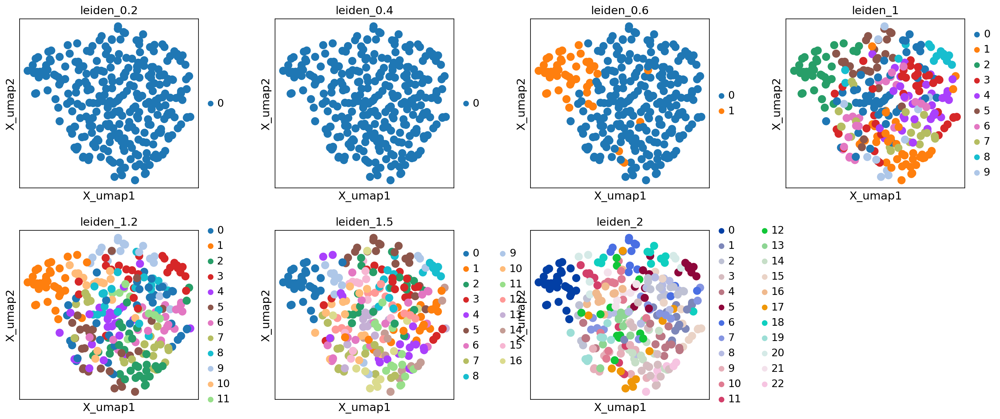

CPU times: user 1.44 s, sys: 39.8 ms, total: 1.48 s
Wall time: 1.53 s


In [54]:
%%time
# reclustering
# leiden clustering
resolutions_list = [0.2,0.4,0.6,1, 1.2,1.5,2]
for resolution in resolutions_list:
    sc.tl.leiden(adata_sub,resolution=resolution,key_added=f'leiden_{str(resolution)}',n_iterations=2)
sc.pl.embedding(adata_sub,basis='X_umap',
                color=[f'leiden_{str(resolution)}' for resolution in resolutions_list],
                wspace=0.3)

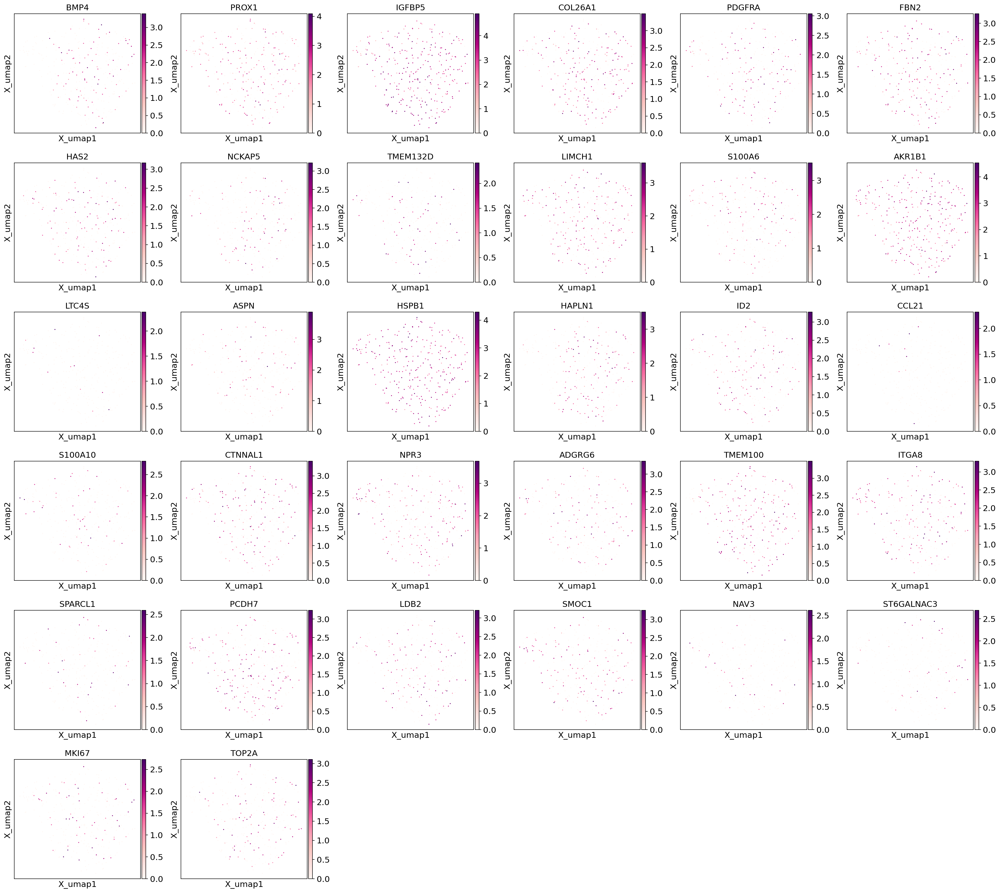

In [55]:
sc.pl.embedding(adata_sub,basis='X_umap',color=genes, size=10,
               ncols=6, wspace=0.2,cmap='RdPu',vmax='p99.7')

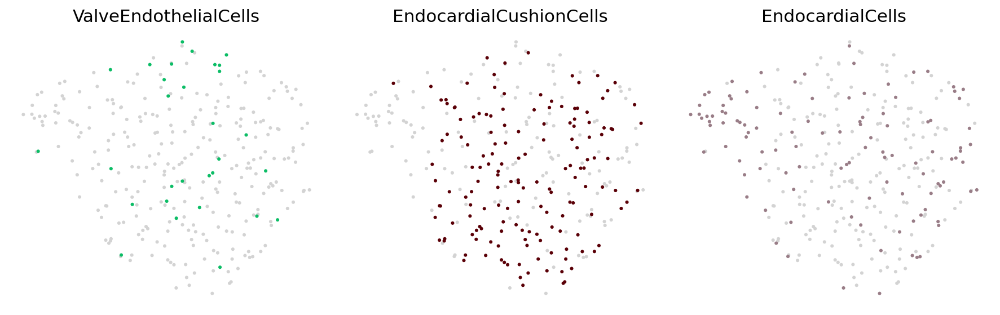

In [56]:
# umap per celltype to highlight
group_col = 'celltypist_midmod2fine'
groups_to_plot = list(set(adata_sub.obs[group_col]))

plt.rcParams['axes.grid'] = False
fig,axs=plt.subplots(nrows=2,ncols=4,figsize=(15,7))
# Flatten the axs array for easier iteration in case of multiple rows and columns
axs_flat = axs.flatten()

for i,grp in enumerate(groups_to_plot):
    sc.pl.umap(adata_sub, color=[group_col], groups=grp, 
               size=30, frameon=False,
               show=False, ax=axs_flat[i], legend_loc=None, legend_fontsize=5,
               title=grp
              )
# Turn off any remaining subplots
for j in range(len(groups_to_plot), len(axs_flat)):
    fig.delaxes(axs_flat[j])

# fig.suptitle('Main Title for the Figure')
fig.tight_layout()

In [57]:
adata_sub_resolution_sel = 0.6

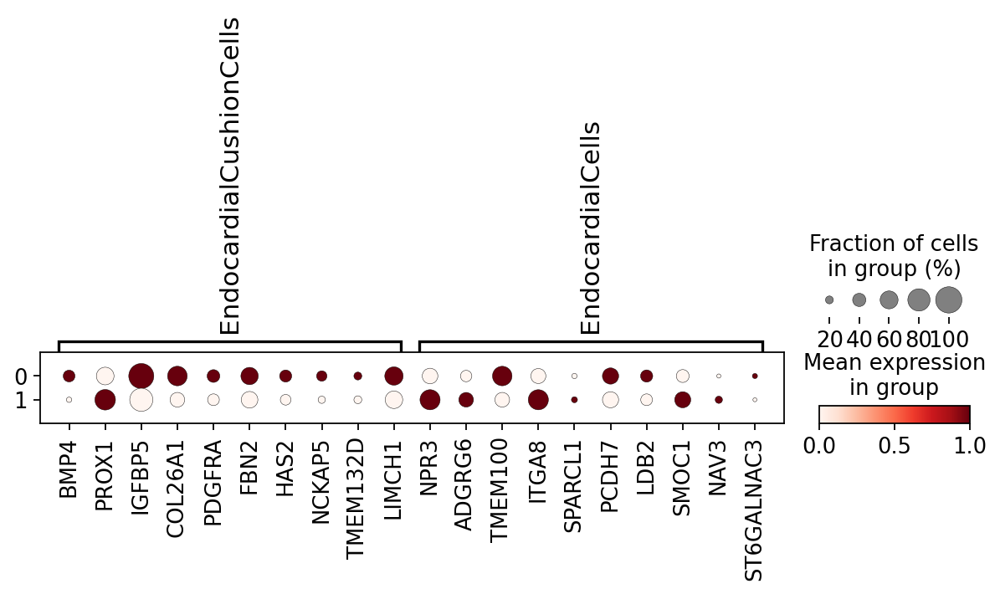

In [69]:
markers_sub = {k:v for k,v in markers.items() if k in ['EndocardialCushionCells','EndocardialCells']}

sc.tl.dendrogram(adata_sub,groupby=f'leiden_{str(adata_sub_resolution_sel)}')
sc.pl.dotplot(adata_sub,
              var_names=markers_sub,
              groupby=f'leiden_{str(adata_sub_resolution_sel)}',
              standard_scale='var',
              dendrogram=True
             )

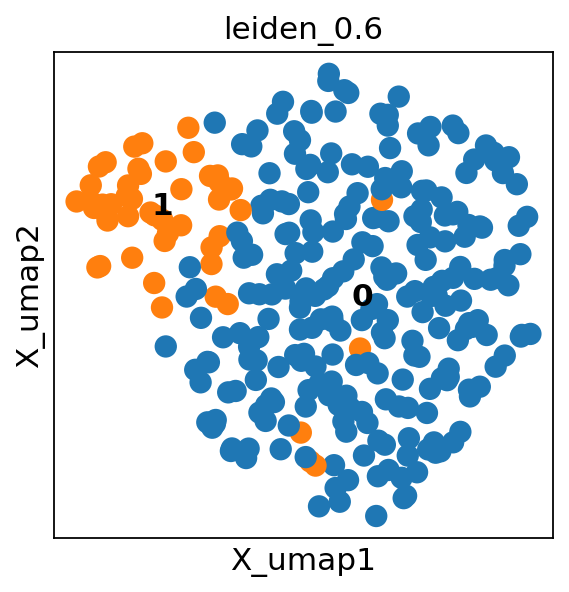

In [61]:
sc.pl.embedding(adata_sub,basis='X_umap',
                color=f'leiden_{str(adata_sub_resolution_sel)}',
                wspace=0.3, legend_loc='on data')

In [62]:
# annotate
adata_sub.obs['fine_grain_manual'] = adata_sub.obs[f'leiden_{str(adata_sub_resolution_sel)}'].copy()
adata_sub.obs.replace({'fine_grain_manual':{
    '0':'EndocardialCushionCells', 
    '1':'EndocardialCells',
}},inplace=True)
adata_sub.obs['fine_grain_manual'].value_counts()

fine_grain_manual
EndocardialCushionCells    247
EndocardialCells            50
Name: count, dtype: int64

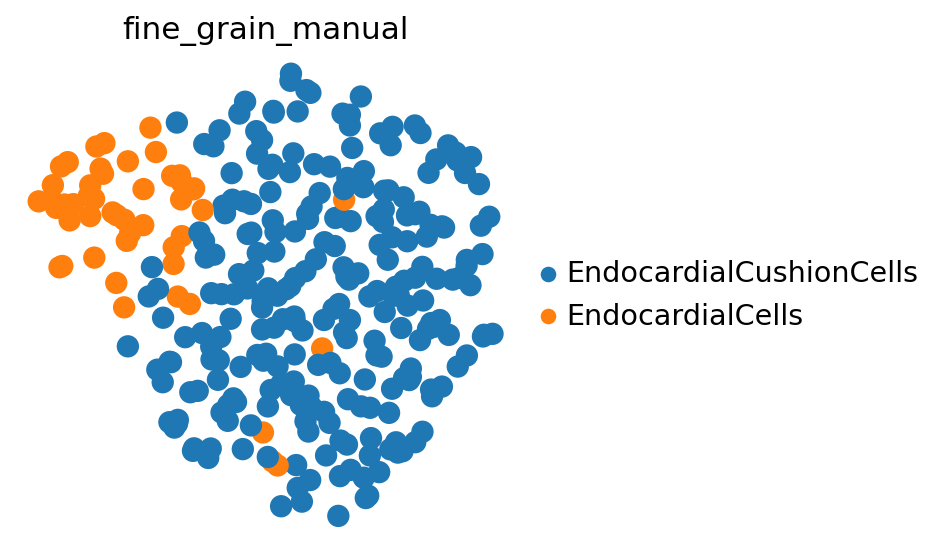

In [63]:
sc.pl.embedding(adata_sub,basis='X_umap',
                color='fine_grain_manual',
                frameon=False,
                wspace=0.3)

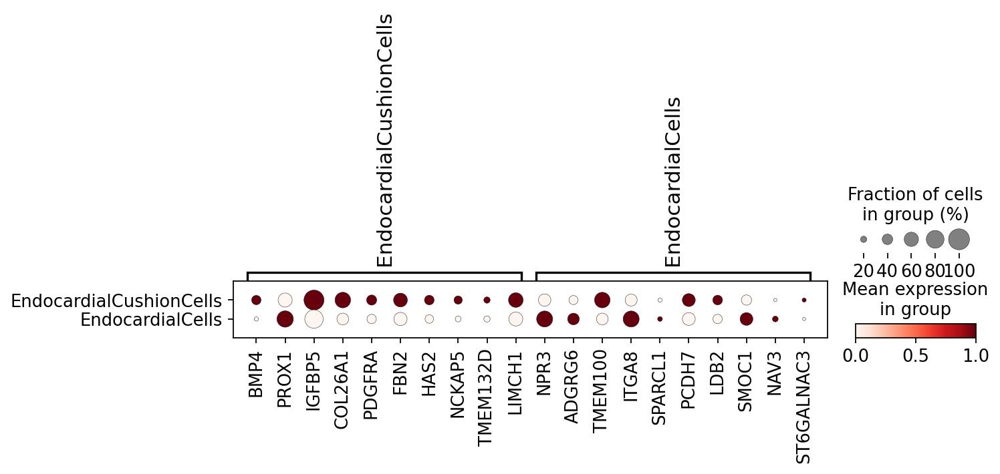

In [68]:
markers_sub = {k:v for k,v in markers.items() if k in ['EndocardialCushionCells','EndocardialCells']}

sc.tl.dendrogram(adata_sub,groupby=f'leiden_{str(adata_sub_resolution_sel)}')
sc.pl.dotplot(adata_sub,
              var_names=markers_sub,
              groupby='fine_grain_manual',
              standard_scale='var',
              dendrogram=True
             )

# Add the annotation to the original adata

In [65]:
# add the annotation to the original adata
adata.obs['fine_grain_manual'] = adata.obs['fine_grain_manual'].astype('str')
adata.obs.loc[adata_sub.obs_names,'fine_grain_manual'] = adata_sub.obs['fine_grain_manual'].astype('str').copy()
adata.obs['fine_grain_manual'].value_counts()

fine_grain_manual
ValveEndothelialCells      585
EndocardialCushionCells    531
EndocardialCells           399
Erythrocytes                11
Name: count, dtype: int64

... storing 'fine_grain_manual' as categorical


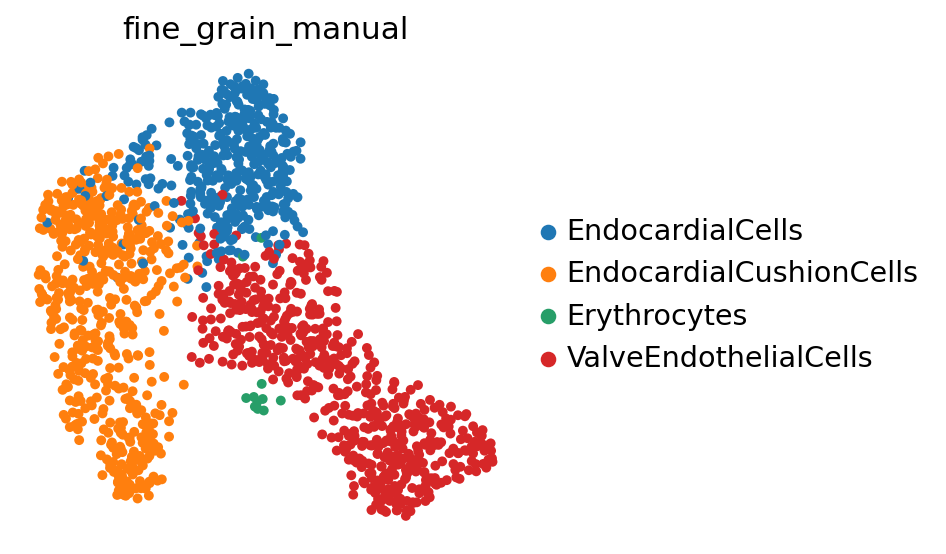

In [66]:
sc.pl.embedding(adata,basis='X_umap',
                color='fine_grain_manual',
                frameon=False,
                wspace=0.3)

categories: EndocardialCells, EndocardialCushionCells, Erythrocytes, etc.
var_group_labels: EndocardialCushionCells, ValveEndothelialCells, EndocardialCells, etc.


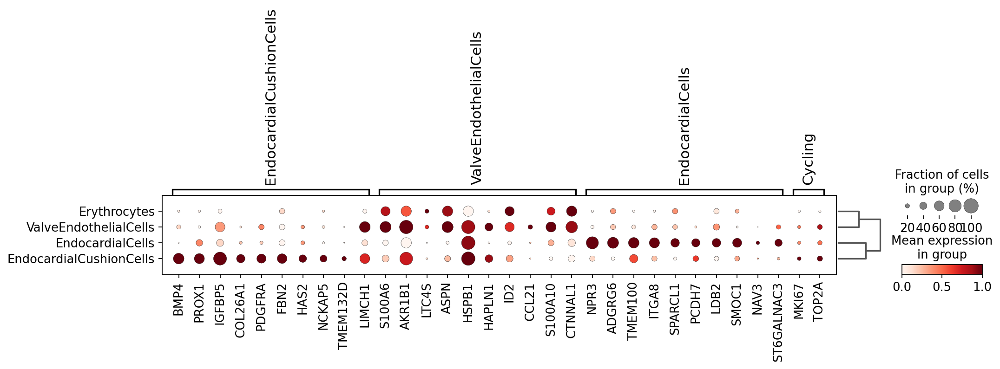

In [67]:
sc.tl.dendrogram(adata,groupby='fine_grain_manual')
sc.pl.dotplot(adata,
              var_names=markers,
              groupby='fine_grain_manual',
              standard_scale='var',
              dendrogram=True
             )

# Save

In [70]:
# save
adata.write(f'{adata_dir}/{sample_id}_{celltype}_b2c_cells_filtered_lognorm.h5ad')
print(f'{adata_dir}/{sample_id}_{celltype}_b2c_cells_filtered_lognorm.h5ad')

/lustre/scratch126/cellgen/team205/kk18/VisiumHD/objects/subsets/HEA_FOET14880396_EndocardialCells_b2c_cells_filtered_lognorm.h5ad
